In [2]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
import mitosheet
import pandas as pd
import networkx as nx
from pyvis.network import Network
from community import community_louvain
from random import randint 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from collections import defaultdict
from collections import Counter
from textblob import TextBlob
import spacy
import re
import seaborn as sns
from spacy.tokens import Doc
import nltk
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.decomposition import NMF 
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [2]:
def load_reddit_data(submission_file, comment_file):                      
    comments_df = pd.read_json(comment_file)
    submissions_df = pd.read_json(submission_file)
    comments_df['created_datetime'] = pd.to_datetime(comments_df['created_utc'], unit='s')
    submissions_df['created_datetime'] = pd.to_datetime(submissions_df['created_utc'], unit='s')
    
    submission_headers = ['id', 'title','name', 'selftext', 'author', 'subreddit', 'created_datetime', 'num_comments',
                      'score', 'ups', 'downs', 'url', 'permalink', 'is_self', 'over_18', 'stickied',
                        'removed_by_category', 'removal_reason', 'banned_by',
                      'subreddit_subscribers','all_awardings','total_awards_received' ]

    comment_headers = ['id', 'body', 'author', 'subreddit', 'created_datetime', 'score', 'ups', 'downs', 'link_id', 'parent_id',
                       'permalink', 'is_submitter', 'controversiality', 'gilded']
    
    submissions_df = submissions_df[submission_headers]
    comments_df =comments_df[comment_headers]

    return submissions_df, comments_df


In [3]:
submissions_df, comments_df = load_reddit_data("InvestmentClub_submissions_refined.json", "InvestmentClub_comments_refined.json")

## Data Aggregation 

In [4]:
def user_interaction_merge(submissions_df, comments_df):
    # Extract Parent Comment IDs (Replies to Other Comments)
    comments_df['parent_comment_id'] = comments_df['parent_id'].str.replace('t1_', '', regex=True)

    # Extract Parent Post IDs (Replies to Submissions)
    comments_df['post_id'] = comments_df['link_id'].str.replace('t3_', '', regex=True)

    # Keep Only Replied Comments (User-to-User Interactions)
    replied_comments_df = comments_df[comments_df['parent_comment_id'].notna()]

    # Merge Comments with Their Parent Users
    user_interaction_df = replied_comments_df.merge(
        comments_df[['id', 'author']],  # Parent comment authors
        left_on='parent_comment_id',
        right_on='id',
        how='left',
        suffixes=('_commenter', '_parent')  # Keeps original comment and parent user
    )

    # Merge with Submissions to Include Post Titles
    user_interaction_df = user_interaction_df.merge(
        submissions_df[['id', 'title']],
        left_on='post_id',
        right_on='id',
        how='left'
    )

    user_interaction_df = user_interaction_df[(user_interaction_df["score"] >= 5)]

    # Return Relevant User Interaction Data
    return user_interaction_df[['author_commenter', 'author_parent', 'post_id', 'title']]



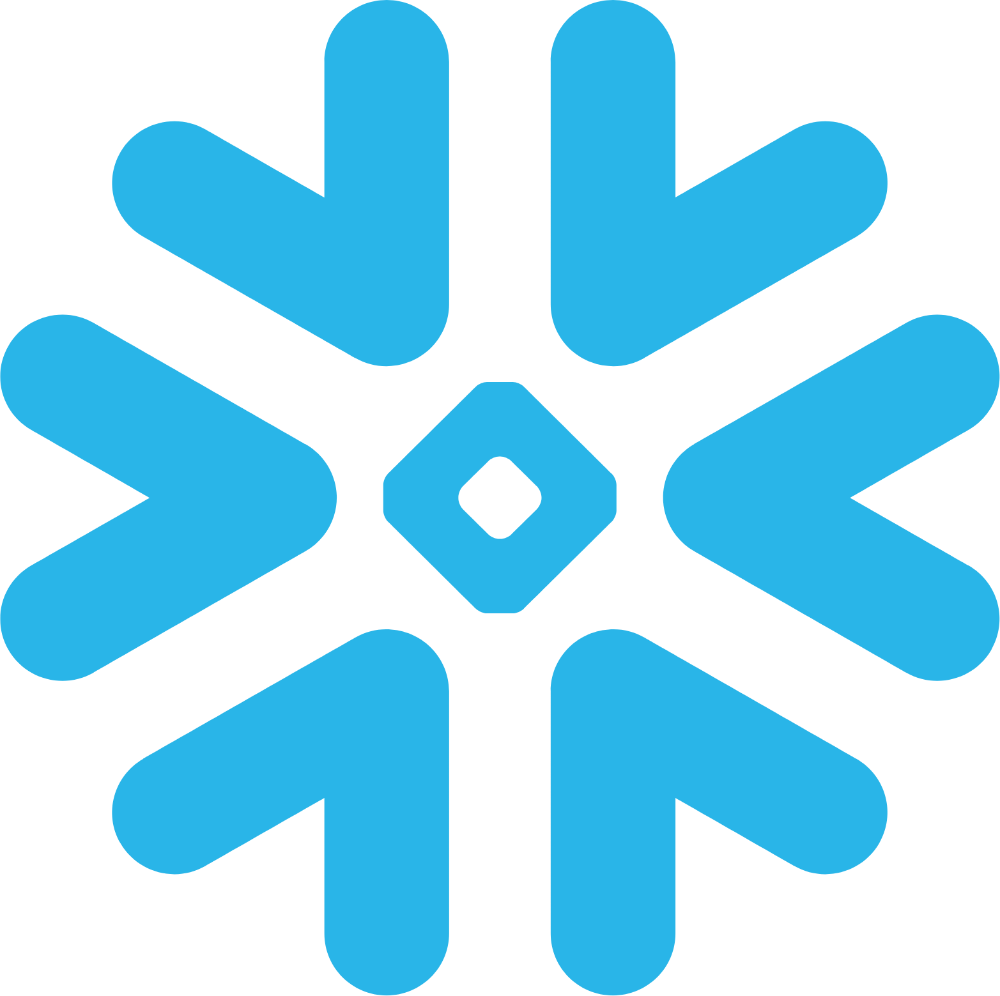

In [5]:
user_interaction_df = user_interaction_merge(submissions_df, comments_df)
user_interaction_df

In [6]:
# Create a directed graph for user influence
G_user_based = nx.DiGraph()

# Add user nodes and interactions
for _, row in user_interaction_df.iterrows():
    # Add post node (post_id as reference, red for posts)
    post_label = str(row["title"])[:50] if pd.notna(row["title"]) else "Unknown Post"
    G_user_based.add_node(row["post_id"], label=post_label, color="red")

    # Add User nodes (blue for users)
    G_user_based.add_node(row["author_commenter"], label=row["author_commenter"], color="blue")
    G_user_based.add_node(row["author_parent"], label=row["author_parent"], color="blue")

    # Create directed edges for user interactions
    G_user_based.add_edge(row["author_commenter"], row["author_parent"])  # User replying to another user
    G_user_based.add_edge(row["author_commenter"], row["post_id"])  # User interacting with the post

# Compute centrality measures to determine user influence
degree_centrality = nx.degree_centrality(G_user_based)
betweenness_centrality = nx.betweenness_centrality(G_user_based)

# Identify top influential users based on centrality
top_degree_users = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_betweenness_users = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

print("\nTop Super Users (Degree Centrality):", top_degree_users)
print("\nTop Super Users (Betweenness Centrality):", top_betweenness_users)




Top Super Users (Degree Centrality): [(nan, 0.43029259896729777), ('[deleted]', 0.04302925989672978), ('Zurevu', 0.0189328743545611), ('magnoliasmanor', 0.008605851979345956), ('Walden_Walkabout', 0.00774526678141136), ('minorthreatmikey', 0.007314974182444063), ('Aranthos-Faroth', 0.006454388984509466), ('cpgbd6', 0.006024096385542169), ('jfk_47', 0.004733218588640275), ('lkk139', 0.004733218588640275)]

Top Super Users (Betweenness Centrality): [('[deleted]', 0.0012504201666144316), ('Zurevu', 0.00039634894043920593), ('Infinite101', 0.00020782965821838489), ('magnoliasmanor', 0.00017634031606408415), ('wittygoldfish', 0.00011891857448859456), ('Gamerxx13', 0.0001011363577426365), ('incutt', 9.93766592104844e-05), ('CaptFartBlaster', 6.075590721535672e-05), ('ILooked', 4.9271558900258806e-05), ('minorthreatmikey', 4.334415331827278e-05)]


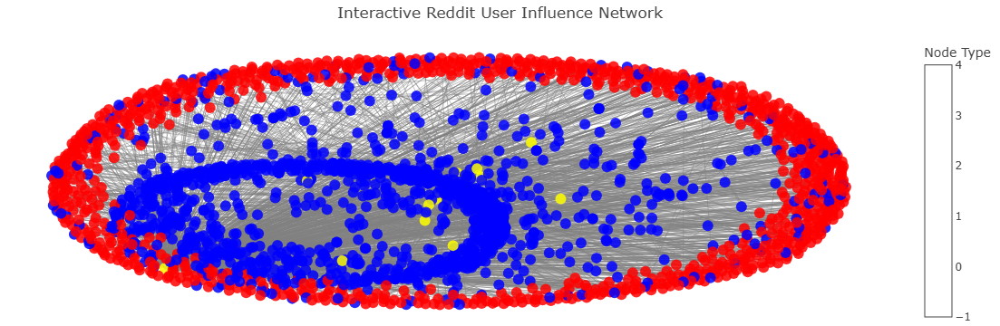

In [7]:
# Combine top users from both metrics
top_users = set(user for user, _ in top_degree_users + top_betweenness_users)

# Generate node positions using spring layout
pos = nx.spring_layout(G_user_based, seed=42)

# Extract edge data for visualization
edge_x, edge_y = [], []
for edge in G_user_based.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)  # Separate edges
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

# Create edge trace (edges between users and posts)
edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color="gray"),
    hoverinfo="none",
    mode="lines"
)

# Extract node data for visualization
node_x, node_y, node_text, node_colors = [], [], [], []
for node in G_user_based.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

    # Assign label for hover text
    node_label = G_user_based.nodes[node].get("label", node)
    node_text.append(node_label)

    # Assign colors based on node type
    if node in user_interaction_df["post_id"].values:
        node_colors.append("red")  # Post Nodes
    elif node in top_users:
        node_colors.append("yellow")  # Top Influential Users
    else:
        node_colors.append("blue")  # Regular Users

# Create node trace (nodes representing posts and users)
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode="markers",
    hoverinfo="text",
    text=node_text,  # Display node labels on hover
    marker=dict(
        color=node_colors,
        size=12,
        opacity=0.85,
        showscale=True,
        colorscale="YlGnBu",
        colorbar=dict(title="Node Type"),
    )
)

# Create the interactive figure
fig = go.Figure(
    data=[edge_trace, node_trace],
    layout=go.Layout(
        title=" Interactive Reddit User Influence Network ",
        showlegend=False,
        hovermode="closest",
        margin=dict(b=0, l=0, r=0, t=40),
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    )
)

# Show the interactive plot
fig.show()


## 3.1  Role of Super Users in the Community

In [8]:
# Extract unique user nodes from both columns
commenters = set(user_interaction_df["author_commenter"].dropna().unique())
parents = set(user_interaction_df["author_parent"].dropna().unique())

# Combine both sets to get all unique user nodes
user_nodes = commenters.union(parents)

# Convert to list if needed
user_nodes = list(user_nodes)

# Display total number of unique users
print(f"Total Unique Users: {len(user_nodes)}")

Total Unique Users: 1391


In [9]:
# Create a subgraph containing only users
G_user_only = G_user_based.subgraph(user_nodes).copy()
G_without_superusers = G_user_based.copy()
G_without_superusers.remove_nodes_from(top_users)
G_user_only_without_superusers = G_without_superusers.subgraph(user_nodes).copy()

# Generate consistent layout for both graphs
pos = nx.spring_layout(G_user_only, seed=42)

# Function to create edge traces
def create_edge_trace(G, pos):
    edge_x, edge_y = [], []
    for edge in G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)
    return go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.5, color="gray"),
        hoverinfo="none",
        mode="lines"
    )

# Function to create node traces
def create_node_trace(G, pos, superusers=set()):
    node_x, node_y, node_text, node_colors = [], [], [], []
    
    for node in G.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_text.append(f"User: {node}")
        node_colors.append("red" if node in superusers else "blue")  # Superusers in red, others in blue

    return go.Scatter(
        x=node_x, y=node_y,
        mode="markers",
        hoverinfo="text",
        text=node_text,
        marker=dict(
            color=node_colors,
            size=8,
            opacity=0.8
        )
    )

# Create edge and node traces for both networks (User-Only)
edge_trace_with_users = create_edge_trace(G_user_only, pos)
node_trace_with_users = create_node_trace(G_user_only, pos, top_users)

edge_trace_without_users = create_edge_trace(G_user_only_without_superusers, pos)
node_trace_without_users = create_node_trace(G_user_only_without_superusers, pos)

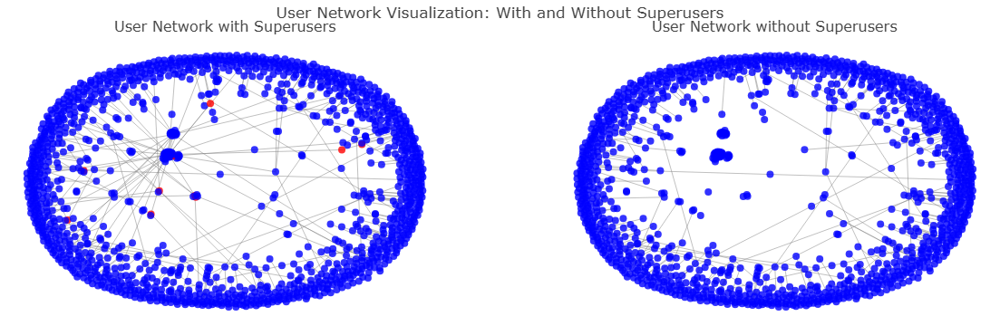

In [10]:
# Create two separate subplots
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("User Network with Superusers", "User Network without Superusers")
)

# Add traces for the first graph (with superusers)
fig.add_trace(edge_trace_with_users, row=1, col=1)
fig.add_trace(node_trace_with_users, row=1, col=1)

# Add traces for the second graph (without superusers)
fig.add_trace(edge_trace_without_users, row=1, col=2)
fig.add_trace(node_trace_without_users, row=1, col=2)

# Set layout
fig.update_layout(
    title_text="User Network Visualization: With and Without Superusers",
    showlegend=False,
    hovermode="closest",
    margin=dict(b=0, l=0, r=0, t=40),
    xaxis1=dict(showgrid=False, zeroline=False, showticklabels=False),
    yaxis1=dict(showgrid=False, zeroline=False, showticklabels=False),
    xaxis2=dict(showgrid=False, zeroline=False, showticklabels=False),
    yaxis2=dict(showgrid=False, zeroline=False, showticklabels=False),
)

# Show interactive plot
fig.show()

### Compute centrality measures

In [11]:
degree_centrality = nx.degree_centrality(G_user_only)
betweenness_centrality = nx.betweenness_centrality(G_user_only)

# Identify super users (top 5% in both metrics)
superuser_threshold = np.percentile(list(degree_centrality.values()), 95)
superusers = {node for node, centrality in degree_centrality.items() if centrality >= superuser_threshold}

print(f"Identified {len(superusers)} Super Users in the Community")

# Measure network connectivity
original_connected_components = nx.number_connected_components(G_user_only.to_undirected())

# Remove superusers and measure new connectivity
G_without_superusers = G_user_based.copy()
G_without_superusers.remove_nodes_from(superusers)
new_connected_components = nx.number_connected_components(G_without_superusers.to_undirected())

print(f"Original Number of Connected Components: {original_connected_components}")
print(f"After Removing Superusers: {new_connected_components}")

Identified 155 Super Users in the Community
Original Number of Connected Components: 943
After Removing Superusers: 225


### Compute the Rich Club Coefficient

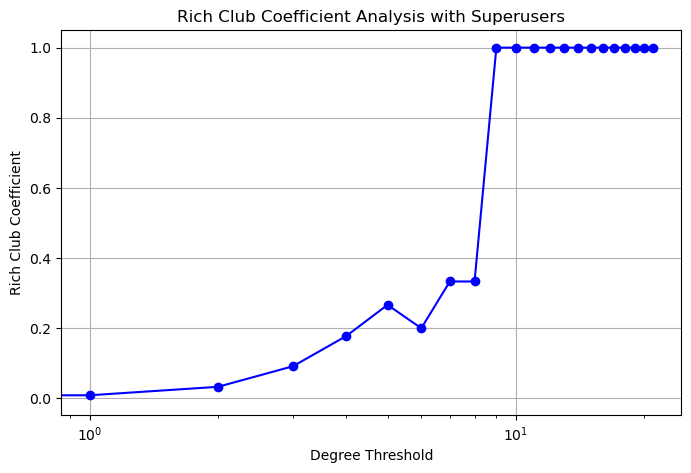

In [12]:
# Convert to undirected graph
G_undirected_super = G_user_only.to_undirected()
G_undirected_super.remove_edges_from(nx.selfloop_edges(G_undirected_super))  # Remove self-loops

# Compute rich-club coefficient safely
rich_club_coefficients = nx.rich_club_coefficient(G_undirected_super, normalized=False)  # Compute without normalization

# Remove cases where degree threshold has zero connections
rich_club_coefficients = {k: v for k, v in rich_club_coefficients.items() if v > 0}  # Filter out zero-edges cases

# Normalize manually to avoid ZeroDivisionError
max_value = max(rich_club_coefficients.values()) if rich_club_coefficients else 1  # Avoid division by zero
rich_club_coefficients = {k: v / max_value for k, v in rich_club_coefficients.items()}

# Convert to sorted values for plotting
degrees = sorted(rich_club_coefficients.keys())
coeff_values = [rich_club_coefficients[d] for d in degrees]

# Plot the rich club coefficient
plt.figure(figsize=(8, 5))
plt.plot(degrees, coeff_values, marker="o", linestyle="-", color="blue")
plt.xlabel("Degree Threshold")
plt.xscale("log")
plt.ylabel("Rich Club Coefficient")
plt.title("Rich Club Coefficient Analysis with Superusers")
plt.grid(True)
plt.show()

### User Engagement Over Time in the Community

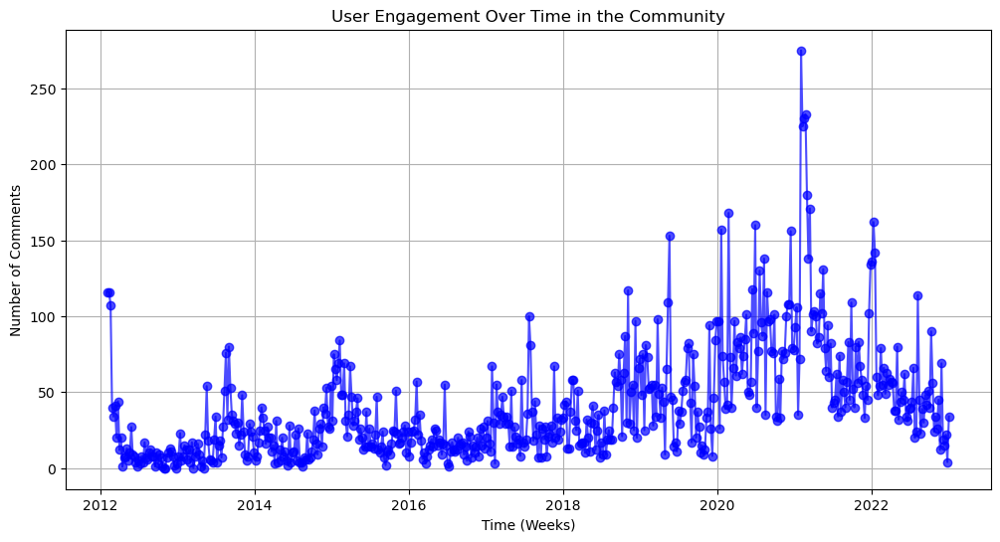

In [13]:
# Aggregate user activity over time (e.g., weekly engagement)
comments_df.set_index('created_datetime', inplace=True)
user_activity = comments_df.resample('W').count()['id']
comments_df = comments_df.reset_index()

# Plot time series of user engagement
plt.figure(figsize=(12, 6))
plt.plot(user_activity, marker='o', linestyle='-', color='blue', alpha=0.7)
plt.xlabel("Time (Weeks)")
plt.ylabel("Number of Comments")
plt.title("User Engagement Over Time in the Community")
plt.grid(True)
plt.show()

## 3.3 How Exclusive Super Users Are in Their Behavior
### Measure How Superusers Engage with the Community
#### Remove Invalid Users from Centrality Rankings

In [14]:
# Filter out NaN and '[deleted]' users
valid_degree_centrality = {user: centrality for user, centrality in degree_centrality.items() if pd.notna(user) and user != "[deleted]"}
valid_betweenness_centrality = {user: centrality for user, centrality in betweenness_centrality.items() if pd.notna(user) and user != "[deleted]"}

# Recalculate top superusers after filtering
top_valid_degree_users = sorted(valid_degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_valid_betweenness_users = sorted(valid_betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

print("Top Super Users (Filtered, Degree Centrality):", top_valid_degree_users)
print("Top Super Users (Filtered, Betweenness Centrality):", top_valid_betweenness_users)


Top Super Users (Filtered, Degree Centrality): [('Zurevu', 0.017266187050359712), ('magnoliasmanor', 0.006474820143884892), ('wittygoldfish', 0.006474820143884892), ('Walden_Walkabout', 0.005035971223021583), ('minorthreatmikey', 0.005035971223021583), ('semen_biscuit', 0.005035971223021583), ('akokaz1', 0.004316546762589928), ('100PERCENTYOLO_VEQT', 0.0035971223021582736), ('incutt', 0.0035971223021582736), ('MayDaze', 0.0028776978417266188)]
Top Super Users (Filtered, Betweenness Centrality): [('Zurevu', 0.0002812436875553553), ('Infinite101', 0.0001367372624578523), ('magnoliasmanor', 0.00011809127212269062), ('wittygoldfish', 8.287106815627412e-05), ('semen_biscuit', 7.717368222053027e-05), ('Gamerxx13', 7.0440407932833e-05), ('CaptFartBlaster', 6.836863122892615e-05), ('incutt', 6.474302199708915e-05), ('_No_Donkey_Brains_', 3.573814814239321e-05), ('ILooked', 3.470225979043979e-05)]


In [15]:
# Remove invalid users from the graph before assortativity calculation
valid_nodes = [node for node in G_user_only.nodes() if pd.notna(node) and node != "[deleted]"]
G_filtered = G_user_only.subgraph(valid_nodes)  # Create a filtered subgraph

nx.set_node_attributes(G_user_only, {user: (user in superusers) for user in G_user_only.nodes()}, "superuser")
for node in G_filtered.nodes():
    if "superuser" not in G_filtered.nodes[node]:
        G_filtered.nodes[node]["superuser"] = False


# Compute assortativity on valid users only
assortativity_filtered = nx.attribute_assortativity_coefficient(G_filtered, "superuser")

print(f"Network Assortativity (After Cleaning): {assortativity_filtered:.4f}")


Network Assortativity (After Cleaning): 0.0714


In [16]:
print(f"Number of nodes: {G_filtered.number_of_nodes()}")
print(f"Number of edges: {G_filtered.number_of_edges()}")

Number of nodes: 1390
Number of edges: 422


## Lets visualize this network with valid users 
### Extract Top Superusers for Visualization

In [17]:
top_superusers = {user for user, _ in top_valid_degree_users + top_valid_betweenness_users}

# Assign Colors Based on Superuser Status
node_colors = []
for node in G_user_only.nodes():
    if node in top_superusers:
        node_colors.append("Red")  # Top Superusers (Highlighted)
    else:
        node_colors.append("blue")  # Regular Users

# Plot the Superuser Influence Network
pos = nx.spring_layout(G_user_only, seed=42)

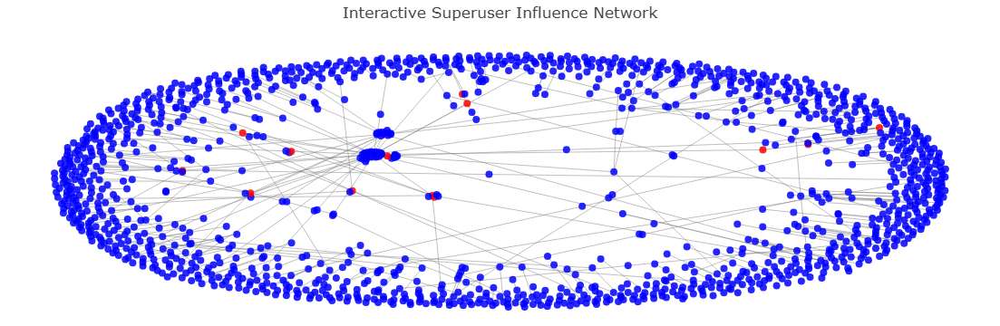

In [18]:
# Extract edge coordinates for visualization
edge_x, edge_y = [], []
for edge in G_user_only.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)  # Separate edges
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

# Create edge trace for visualization
edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color="gray"),
    hoverinfo="none",
    mode="lines"
)

# Extract node data for visualization
node_x, node_y, node_colors, node_text = [], [], [], []
for node in G_user_only.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    
    # Color superusers red and others blue
    color = "red" if node in top_superusers else "blue"
    node_colors.append(color)

    node_text.append(f"User: {node}")  # Optional hover info

# Create node trace with color distinction
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode="markers",
    hoverinfo="text",
    text=node_text,
    marker=dict(
        color=node_colors,
        size=8,
        opacity=0.85,
        showscale=False,  # Remove colorbar as it's categorical
    )
)

# Create interactive figure
fig = go.Figure(
    data=[edge_trace, node_trace],
    layout=go.Layout(
        title="Interactive Superuser Influence Network",
        showlegend=False,
        hovermode="closest",
        margin=dict(b=0, l=0, r=0, t=40),
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    )
)

# Show the interactive plot
fig.show()

## Engagement Timeline of Superusers 
### Extract engagement timestamps for superusers

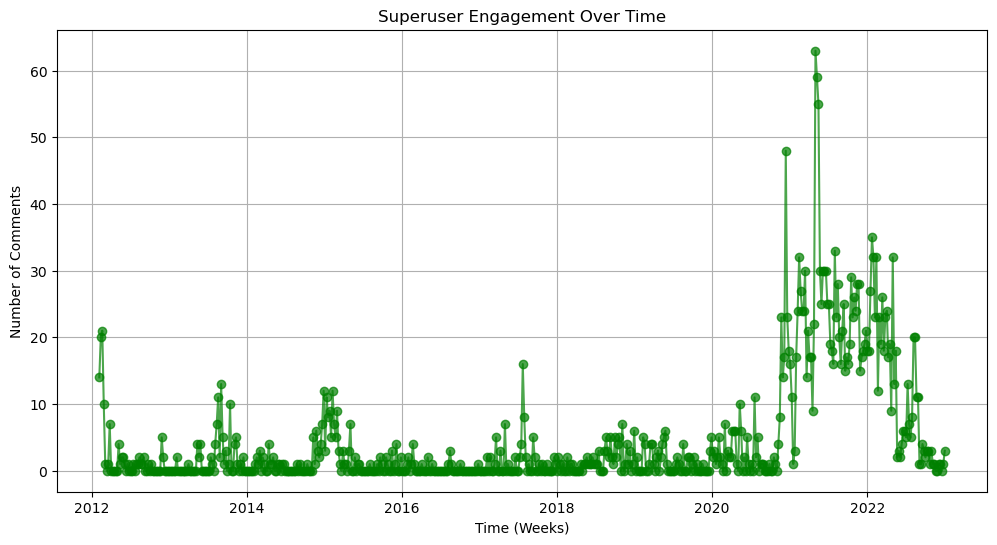

In [19]:
superuser_comments = comments_df[comments_df['author'].isin(top_superusers)]

# Resample superuser engagement per week
superuser_activity = superuser_comments.set_index('created_datetime').resample('W').count()['id']

# Plot Superuser Engagement Over Time
plt.figure(figsize=(12, 6))
plt.plot(superuser_activity, marker='o', linestyle='-', color='green', alpha=0.7)
plt.xlabel("Time (Weeks)")
plt.ylabel("Number of Comments")
plt.title("Superuser Engagement Over Time")
plt.grid(True)
plt.show()


### Clustering Analysis to See if Superusers Form Isolated Groups
#### Run Louvain Community Detection

In [20]:
# Ensure G_user_based is an undirected graph
G_user_based_undirected = G_user_only.to_undirected()

# Perform community detection
partition = community_louvain.best_partition(G_user_based_undirected)

# Count how many superusers belong to the same communities
superuser_community_counts = pd.Series([partition[node] for node in top_superusers if node in partition]).value_counts()

print("Superuser Distribution Across Communities:")
print(superuser_community_counts)

Superuser Distribution Across Communities:
73     3
6      2
1      2
214    2
418    2
242    1
270    1
148    1
484    1
Name: count, dtype: int64


In [21]:
# Generate positions for nodes
pos = nx.kamada_kawai_layout(G_user_based_undirected)

# Extract edge data for visualization
edge_x, edge_y = [], []
for edge in G_user_based_undirected.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)  # Separate edges
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

# Create edge trace for visualization
edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color="gray"),
    hoverinfo="none",
    mode="lines"
)


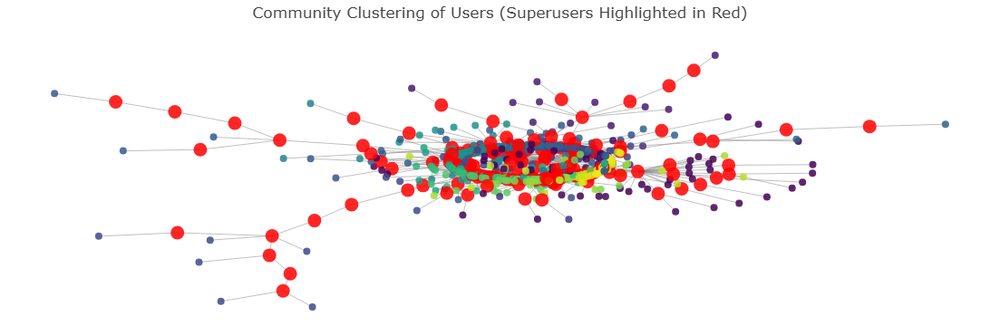

In [22]:
# Ensure partition contains valid community assignments
unique_communities = list(set(partition.values()))
color_map = {community: plt.cm.viridis(i / len(unique_communities)) for i, community in enumerate(unique_communities)}

# Identify top superusers (top 5% of degree centrality)
degree_centrality = nx.degree_centrality(G_user_based_undirected)
superuser_threshold = np.percentile(list(degree_centrality.values()), 95)
top_superusers = {node for node, centrality in degree_centrality.items() if centrality >= superuser_threshold}

# Extract node data for visualization with superusers in red
node_x, node_y, node_text, node_colors, node_sizes = [], [], [], [], []
for node in G_user_based_undirected.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_text.append(str(node))  # Display node ID as text

    if node in top_superusers:
        node_colors.append("red")  # Highlight superusers
        node_sizes.append(15)  # Superusers appear larger
    else:
        community_id = partition.get(node, -1)  # Get community, default to -1 if missing
        if community_id != -1:
            node_colors.append(f"rgb({int(color_map[community_id][0] * 255)}, {int(color_map[community_id][1] * 255)}, {int(color_map[community_id][2] * 255)})")  # Convert to RGB
        else:
            node_colors.append("gray")  # Fallback for missing community assignment
        node_sizes.append(8)  # Keep regular users smaller

# Create node trace with superusers highlighted
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode="markers",
    hoverinfo="text",
    text=node_text,  # Display node labels on hover
    marker=dict(
        color=node_colors,
        size=node_sizes,
        opacity=0.85,
        showscale=False,  # Disable default color scale
    )
)

# Create the interactive figure with superusers highlighted
fig = go.Figure(
    data=[edge_trace, node_trace],
    layout=go.Layout(
        title="Community Clustering of Users (Superusers Highlighted in Red)",
        showlegend=False,
        hovermode="closest",
        margin=dict(b=0, l=0, r=0, t=40),
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    )
)

# Show the interactive plot
fig.show()

### Engagement metrics per community and displaying the top 10 communities


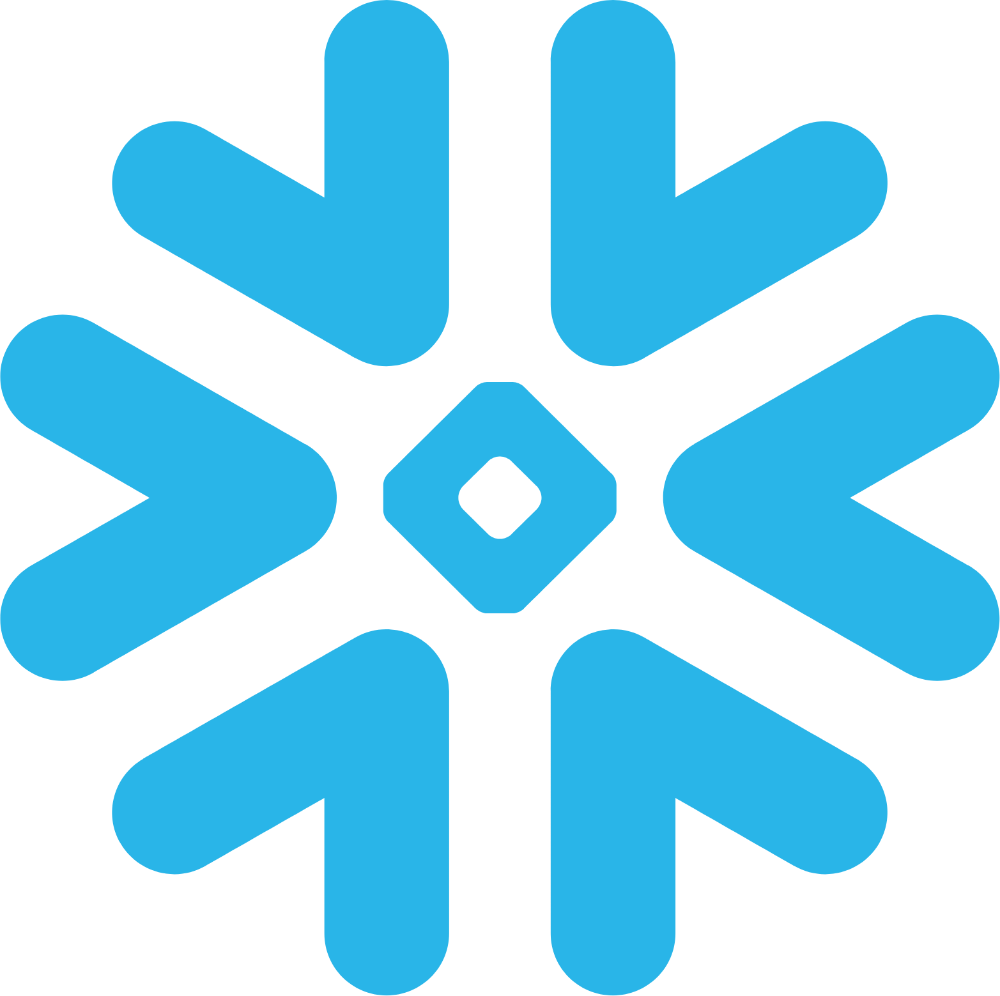

In [23]:
# Ensure community mapping is correctly applied
comments_df["community"] = comments_df["author"].map(partition)
submissions_df["community"] = submissions_df["author"].map(partition)

# Aggregate engagement metrics for submissions and comments based on detected communities
submissions_engagement = submissions_df.groupby("community")[["num_comments", "score", "total_awards_received"]].sum()
comments_engagement = comments_df.groupby("community")[["score", "controversiality"]].sum()

# Merge both datasets to get total engagement per community
total_engagement = submissions_engagement.add(comments_engagement, fill_value=0)

# Compute the new engagement ranking metric using the weighted formula
total_engagement["engagement_score"] = (
    total_engagement["num_comments"] * 1.5 +  # Weight comments higher
    total_engagement["controversiality"] * 1 +  # Controversial discussions count positively
    total_engagement["score"] * 2 +  # Reddit’s score (includes upvotes-downvotes balance)
    total_engagement["total_awards_received"] * 3  # High weight for awards (Reddit Gold)
)

# Rank communities by engagement score
ranked_communities = total_engagement.sort_values(by="engagement_score", ascending=False).reset_index()

# Display the top 10 highly engaging communities
top_10_communities = ranked_communities.head(10)

top_10_communities

## Analyzing the most discussed topics within these top communities

In [24]:
# Load the English NLP model
nlp = spacy.load("en_core_web_sm")

# Load stopwords from the custom stopword file
with open("stopwordFile.txt", "r") as f:
    custom_stopwords = set(f.read().split())

In [25]:
def clean_text(text, stopwords):
    text = re.sub(r"http\S+|www\S+", "", text)  # Remove URLs
    text = re.sub(r"\d+", "", text)  # Remove numbers
    text = text.lower()  # Convert to lowercase
    text = re.sub(r"[^\w\s]", "", text)  # Remove punctuation
    words = text.split()
    words = [word for word in words if word not in stopwords]  # Remove custom stopwords
    return " ".join(words)


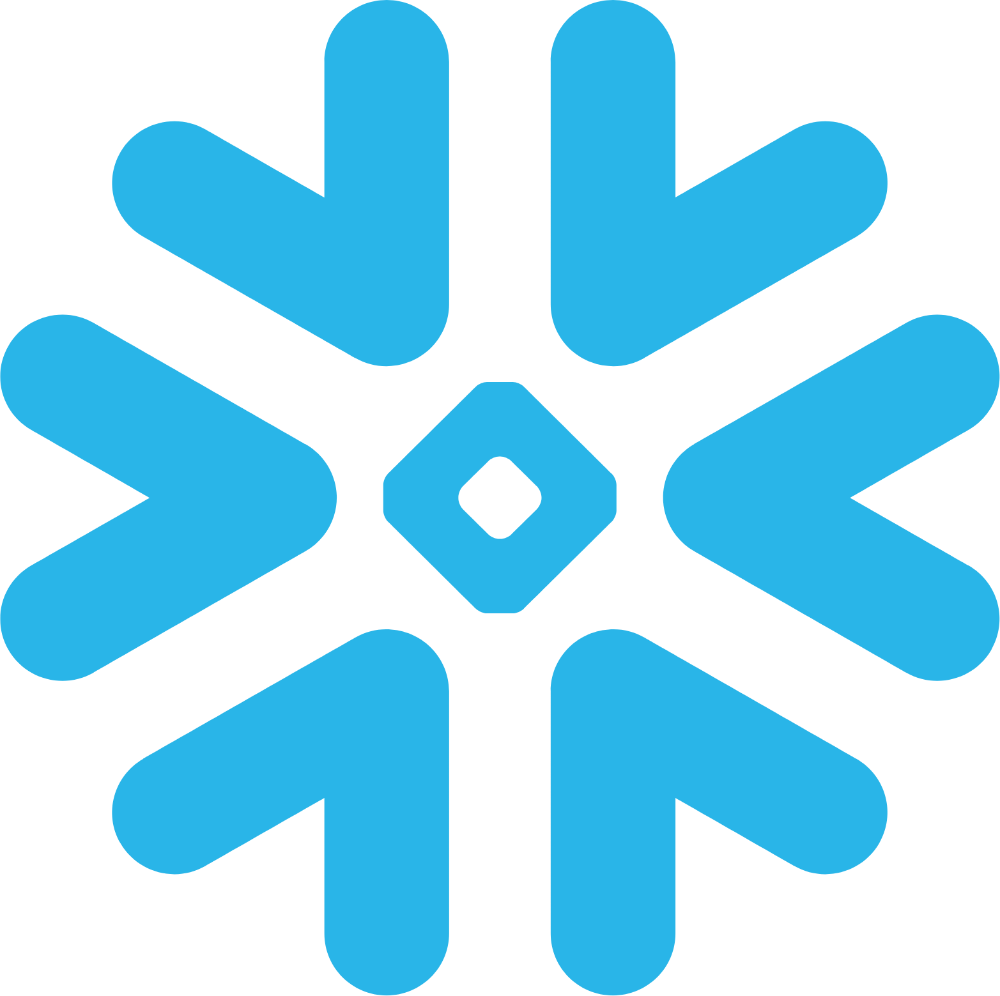

In [26]:
# Define the top 10 communities based on engagement
top_communities_ID = list(top_10_communities["community"])

# Filter submissions and comments belonging to the top communities
filtered_submissions = submissions_df[submissions_df["community"].isin(top_communities_ID)].copy()
filtered_comments = comments_df[comments_df["community"].isin(top_communities_ID)].copy()

# Process text within the filtered dataset
filtered_submissions["clean_text"] = (
    filtered_submissions["title"].fillna("") + " " + filtered_submissions["selftext"].fillna("")).apply(lambda text: clean_text(text, custom_stopwords))

filtered_comments["clean_text"] = filtered_comments["body"].fillna("").apply(lambda text: clean_text(text, custom_stopwords))

# Merge filtered submissions and comments into a new dataset
community_specific_combined_df = pd.concat(
    [
        filtered_submissions[["community", "author", "clean_text", "created_datetime"]],
        filtered_comments[["community", "author", "clean_text", "created_datetime"]]
    ],
    ignore_index=True
)

community_specific_combined_df


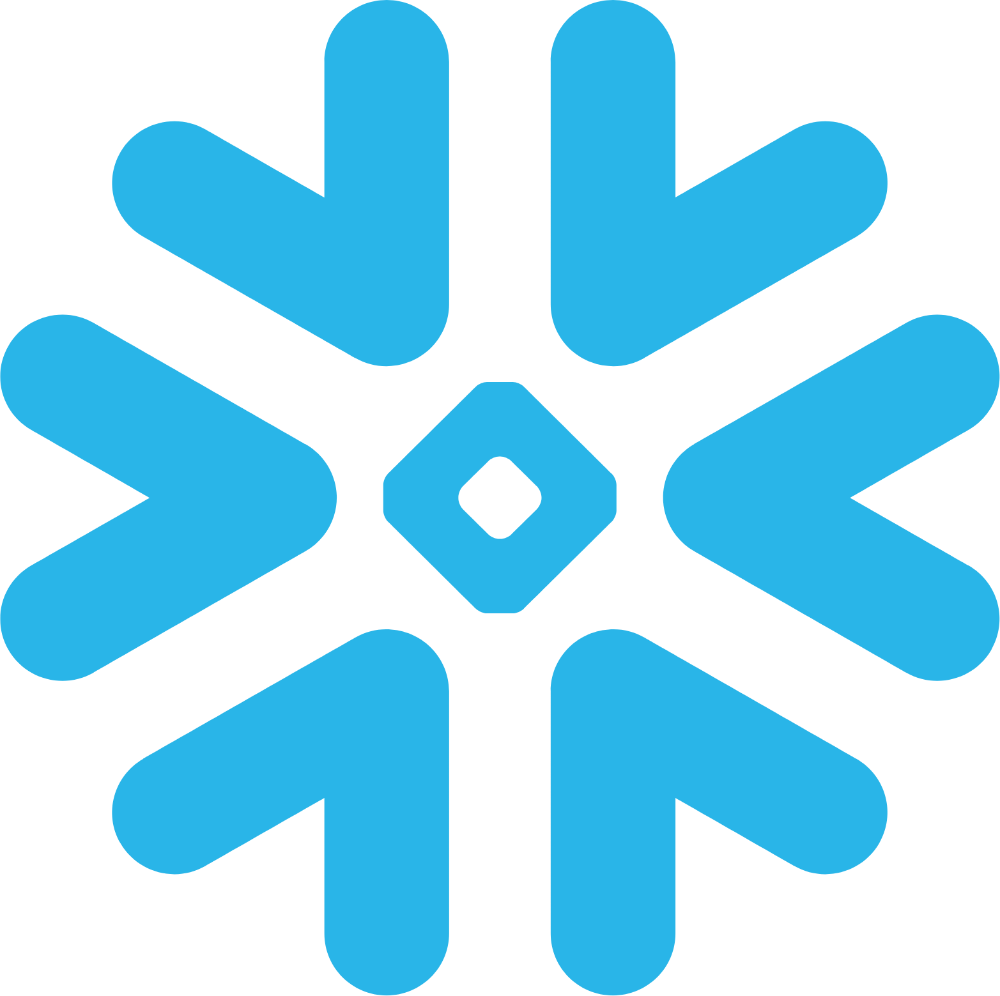

In [27]:
# Extract cluster texts
cluster_texts = defaultdict(list)
for _, row in community_specific_combined_df.iterrows():
    cluster_texts[row["community"]].append(row["clean_text"])

# --- Extract Named Entities Using spaCy ---
def extract_entities(text):
    """Extracts named entities from text using spaCy."""
    doc = nlp(text)
    entities = [ent.text.lower() for ent in doc.ents if ent.label_ in {"ORG", "GPE", "MONEY", "PERSON", "PRODUCT", "EVENT"}]
    return entities

# Process each cluster
cluster_entities = {}
for cluster, texts in cluster_texts.items():
    full_text = " ".join(texts)
    entities = extract_entities(full_text)
    cluster_entities[cluster] = Counter(entities).most_common(10)  # Get top 10 most frequent entities

# --- Convert to DataFrame for Display ---
topics_data = []
for cluster, entities in cluster_entities.items():
    topics_data.append({"Cluster": cluster, "Top Entities": ", ".join([f"{ent[0]} ({ent[1]})" for ent in entities])})

topics_df = pd.DataFrame(topics_data)
topics_df

## Trend Analysis over time

In [28]:
# Convert created_datetime column to datetime format
community_specific_combined_df["created_datetime"] = pd.to_datetime(community_specific_combined_df["created_datetime"])

# Extract Year-Month for trend analysis
community_specific_combined_df["year_month"] = community_specific_combined_df["created_datetime"].dt.to_period("M")
# Apply entity extraction to each row
community_specific_combined_df["entities"] = community_specific_combined_df["clean_text"].apply(lambda x: extract_entities(x))

# Flatten the dataset for counting
entity_time_series = community_specific_combined_df.explode("entities").groupby(["year_month", "entities"]).size().reset_index(name="count")

# Filter top financial entities
top_entities = entity_time_series.groupby("entities")["count"].sum().sort_values(ascending=False).head(10).index.tolist()
filtered_trend_data = entity_time_series[entity_time_series["entities"].isin(top_entities)]

<Figure size 1200x600 with 0 Axes>

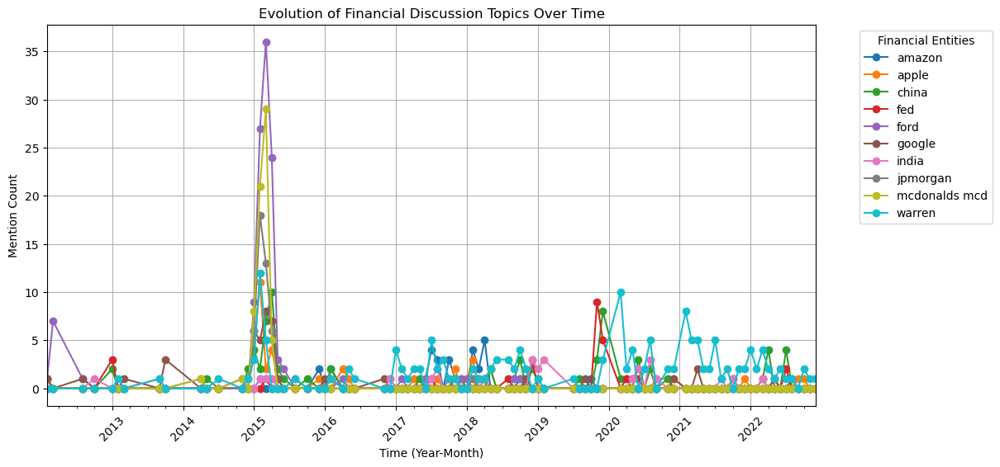

In [29]:
plt.figure(figsize=(12, 6))

# Pivot data for visualization
trend_pivot = filtered_trend_data.pivot(index="year_month", columns="entities", values="count").fillna(0)

# Plot trends
trend_pivot.plot(figsize=(12, 6), marker="o", linestyle="-")
plt.xlabel("Time (Year-Month)")
plt.ylabel("Mention Count")
plt.title("Evolution of Financial Discussion Topics Over Time")
plt.legend(title="Financial Entities", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.xticks(rotation=45)
plt.grid()
plt.show()

## Sentiment Analysis
### To explore whether these spikes were driven by positive or negative discussions

In [30]:
# Initialize Sentiment Analyzer
analyzer = SentimentIntensityAnalyzer()

# Function to compute sentiment score
def get_sentiment(text):
    if pd.isna(text) or text.strip() == "":
        return 0  # Neutral sentiment for empty text
    return analyzer.polarity_scores(text)["compound"]

In [31]:
# Apply sentiment analysis to submissions and comments
filtered_submissions["sentiment"] = filtered_submissions["clean_text"].apply(get_sentiment)
filtered_comments["sentiment"] = filtered_comments["clean_text"].apply(get_sentiment)

In [32]:
# Aggregate sentiment over time
submissions_sentiment = filtered_submissions.groupby("created_datetime")["sentiment"].mean()
comments_sentiment = filtered_comments.groupby("created_datetime")["sentiment"].mean()

# Merge sentiment and discussion volume data
sentiment_trend = pd.DataFrame({
    "Submission Sentiment": submissions_sentiment,
    "Comment Sentiment": comments_sentiment
}).fillna(0)  # Fill NaN values with neutral sentiment

### Enhanced Sentiment Analysis Visualization mapped to the real-time events

In [33]:
# Ensure sentiment_trend index is a DatetimeIndex
if not isinstance(sentiment_trend.index, pd.DatetimeIndex):
    sentiment_trend.index = pd.to_datetime(sentiment_trend.index)

# Define financial events with broader timeframes
financial_events = {
    "2020-03": ("COVID-19 Market Crash", "red"),
    "2021-01": ("GameStop Short Squeeze", "blue"),
    "2018-12": ("2018 Christmas Eve Drop", "red"),
    "2016-06": ("Brexit Market Impact", "blue"),
    "2015-08": ("China Market Crash", "red"),
}

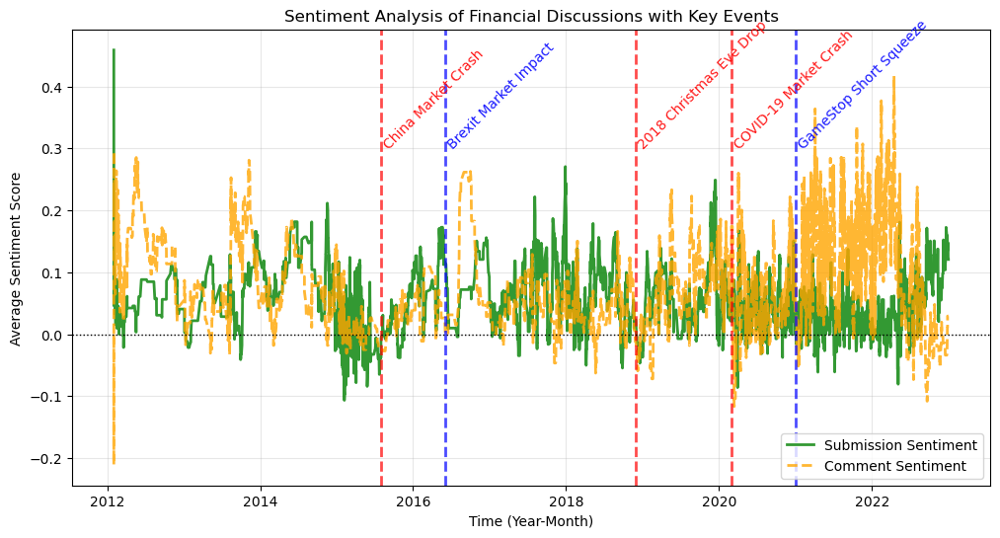

In [34]:
# Convert event dates to DatetimeIndex
event_dates = {pd.to_datetime(date): details for date, details in financial_events.items()}

# Apply a 30-day rolling average for smooth visualization
sentiment_trend_smoothed = sentiment_trend.rolling(window=30, min_periods=1).mean()

# Plot figure
plt.figure(figsize=(12, 6))

# **No extra to_timestamp() needed**
plt.plot(sentiment_trend_smoothed.index, sentiment_trend_smoothed["Submission Sentiment"], 
         label="Submission Sentiment", color="green", linewidth=2, alpha=0.8)
plt.plot(sentiment_trend_smoothed.index, sentiment_trend_smoothed["Comment Sentiment"], 
         label="Comment Sentiment", color="orange", linestyle="dashed", linewidth=2, alpha=0.8)

# Add financial event markers
for date, (event, color) in event_dates.items():
    plt.axvline(x=date, color=color, linestyle="dashed", alpha=0.7, linewidth=2)
    plt.text(date, 0.3, event, rotation=45, fontsize=10, color=color, alpha=0.9)

# Formatting
plt.axhline(y=0, color="black", linestyle="dotted", linewidth=1)
plt.title("Sentiment Analysis of Financial Discussions with Key Events")
plt.xlabel("Time (Year-Month)")
plt.ylabel("Average Sentiment Score")
plt.legend()
plt.grid(alpha=0.3)

# Show the plot
plt.show()